# Тестовое задание для кейса "Разработка приложения по аналитике данных современных городов"

# Выбор задачи

Для анализа и визуализации были выбраны данные о пассажиропотоках в метрополитене Нью-Йорка (https://data.cityofnewyork.us/NYC-BigApps/Traffic-Volume-Counts-2012-2013-/p424-amsu). На этом этапе нам, к сожалению, не удалось найти данные о каком-либо российском метрополитене.

Схема метрополитена выглядит следующим образом:

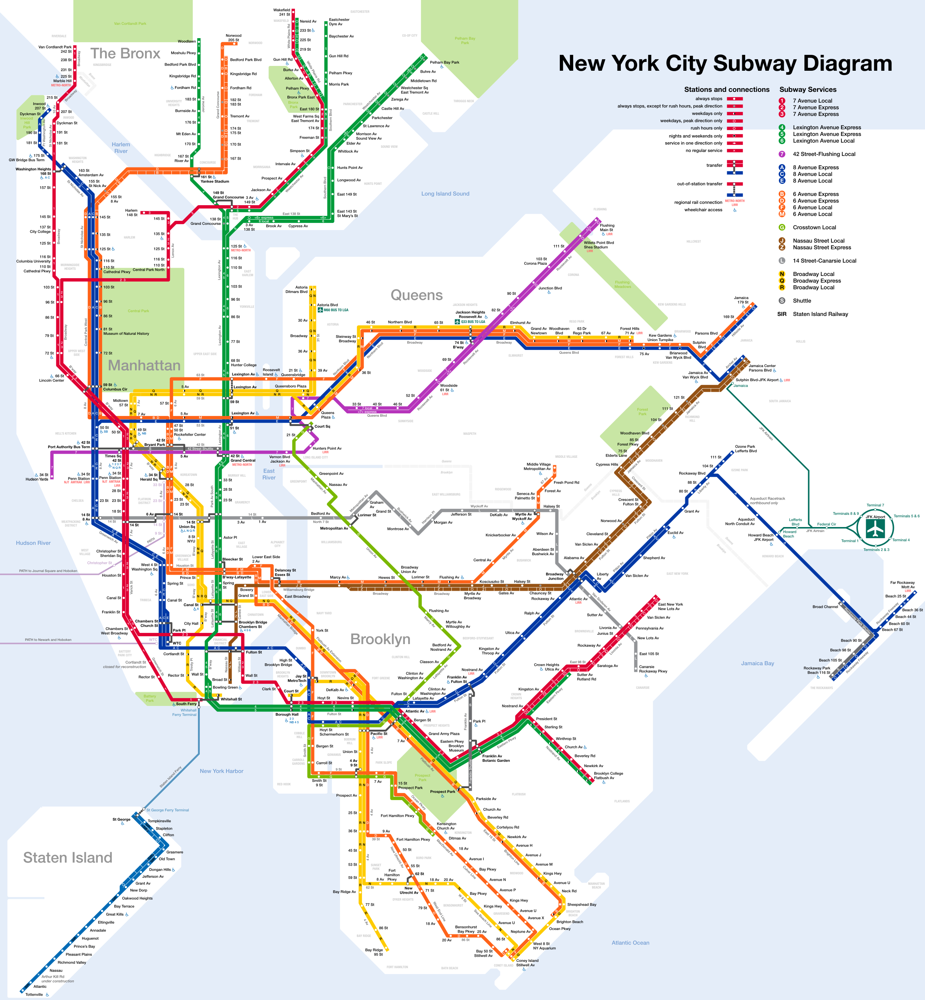

In [1]:
import IPython.display
IPython.display.Image('NYC_subway-4D.png')

Здесь представлены подготовка данных и визуализация нагрузки на 4 станции линии L метрополитена.

In [2]:
# Загружаем необходимые библиотеки
import numpy as np
import pandas as pd
import holoviews as hv
import matplotlib.pyplot as plt

import itertools
import warnings

%matplotlib notebook
%load_ext holoviews.ipython

In [3]:
# Загружаем данные
data = pd.read_csv('Traffic_Volume_Counts__2012-2013_.csv', parse_dates=['Date'])
data.head(2)

,ID,Segment ID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,1,2153,HUGUENOT AVE,WOODROW RD,STAFFORD AVE,NB,2013-02-02,106,74,45,...,371,398,324,394,379,329,249,197,187,169
1,1,2153,HUGUENOT AVE,WOODROW RD,STAFFORD AVE,NB,2013-02-03,109,74,55,...,308,291,313,253,242,217,210,144,125,79


In [4]:
# Выбираем только те данные, которые относятся к выбранным нами станциям
L_line_stations = [
    'UNION STREET',
    'UNION AVE',
    'BEDFORD AVENUE',
    'LORIMER ST',
    'LORIME ST',
    'LORIME ST ',
    'JEFFERSON AVE',
]
L_line_data = data[(data['From'].isin(L_line_stations)) | (data['To'].isin(L_line_stations))]

In [5]:
# Исправляем неточности в названиях станций в таблице
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    L_line_data['From'][:] = L_line_data['From'].str.replace('UNION AVE', 'UNION STREET')
    L_line_data['To'][:] = L_line_data['To'].str.replace('UNION AVE', 'UNION STREET')
    L_line_data['From'][:] = L_line_data['From'].str.replace('LORIME ST', 'LORIMER ST')
    L_line_data['To'][:] = L_line_data['To'].str.replace('LORIME ST', 'LORIMER ST')
    L_line_data['To'][:] = L_line_data['To'].str.replace('LORIME ST ', 'LORIMER ST')
    L_line_data['From'][:] = L_line_data['From'].str.replace('LORIME ST ', 'LORIMER ST')
    
    L_line_data['From'][L_line_data['From']=='LORIMER ST '] = 'LORIMER ST'
    L_line_data['To'][L_line_data['To']=='LORIMER ST '] = 'LORIMER ST'

In [6]:
hours_index = range(24)
days_index = pd.date_range(L_line_data['Date'].min(), L_line_data['Date'].max())
routes = L_line_data[['From', 'To']].drop_duplicates()
routes_index = pd.MultiIndex.from_tuples(zip(routes.values[:, 0], routes.values[:, 1]))
L_line_panel = pd.Panel(items=hours_index, major_axis=days_index, minor_axis=routes_index, dtype=int)
L_line_panel.iloc[:, :, :] = 0

In [7]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    L_line_data['route'] = zip(L_line_data['From'], L_line_data['To'])

In [8]:
for day, route in itertools.product(days_index, routes_index):
    day = pd.Timestamp(day)
    if L_line_data[(L_line_data['route']==route) & (L_line_data['Date']==day)].size == 0:
        pass
    else:
        series = pd.Series(L_line_data[(L_line_data['route']==route) & (L_line_data['Date']==day)].iloc[0, 7:7+24].values, index=hours_index)
        L_line_panel.loc[:, day, route].iloc[:] = series.astype(int)

In [9]:
L_line_stations = [
    'UNION STREET',
    'BEDFORD AVENUE',
    'LORIMER ST',
    'JEFFERSON AVE',
]
L_stations_visitors_dataset = pd.Panel(items=hours_index, major_axis=days_index, minor_axis=L_line_stations, dtype=int)
L_stations_visitors_dataset.loc[:, :, :] = 0

In [10]:
# Находим количество пассажиров, побывавших на станции
for hour, day, station in itertools.product(hours_index, days_index, L_line_stations):
    L_stations_visitors_dataset.loc[hour, day, station] = \
        L_line_panel.loc[hour, day, L_line_panel.minor_axis.get_level_values(0) == station].sum() + \
        L_line_panel.loc[hour, day, L_line_panel.minor_axis.get_level_values(1) == station].sum()

In [11]:
# Будем рассматривать только зависимость количества пассажиров от времени суток
# (просуммируем по дате за весь рассматриваемый период)
dataset = L_stations_visitors_dataset.sum(axis=1)
dataset

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
UNION STREET,1495,1069,895,770,856,1004,1675,2302,2413,2501,...,3581,4021,4302,4078,3324,2849,2537,2142,1997,1737
BEDFORD AVENUE,441,306,201,175,194,254,451,1106,1459,1124,...,1597,1692,1431,1477,1540,1251,1086,837,741,610
LORIMER ST,4142,3330,2770,2192,2150,2105,3179,4797,5799,5655,...,7387,8215,8860,9080,7817,6971,6362,5412,4864,4535
JEFFERSON AVE,1972,1456,1207,1559,2236,4524,8437,10200,9827,8675,...,10068,9832,9553,10522,7845,5661,4282,3231,2677,2404


Изобразим на схеме метрополитена пассажиропоток на станциях за весь период с помощью цвета:

:HoloMap   [hour]
   :Overlay
      .RGB.I    :RGB   [x,y]   (R,G,B,A)
      .Points.I :Points   [x,y]   (z,alpha)
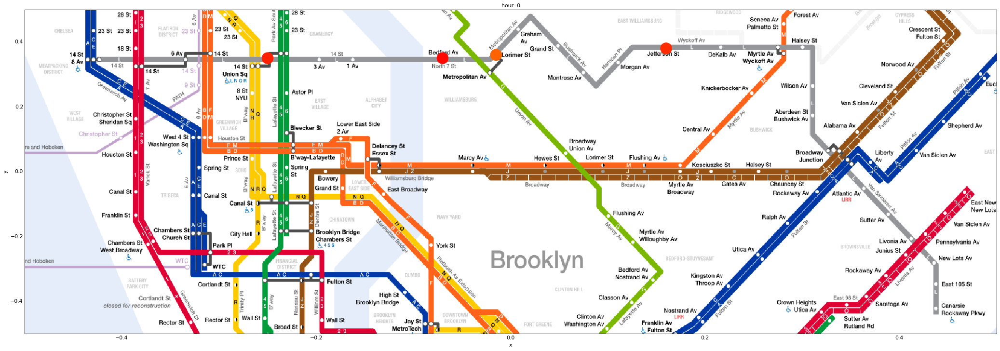
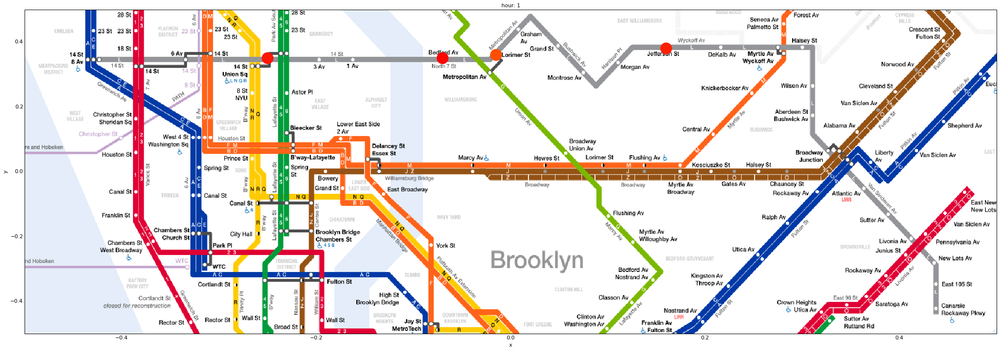
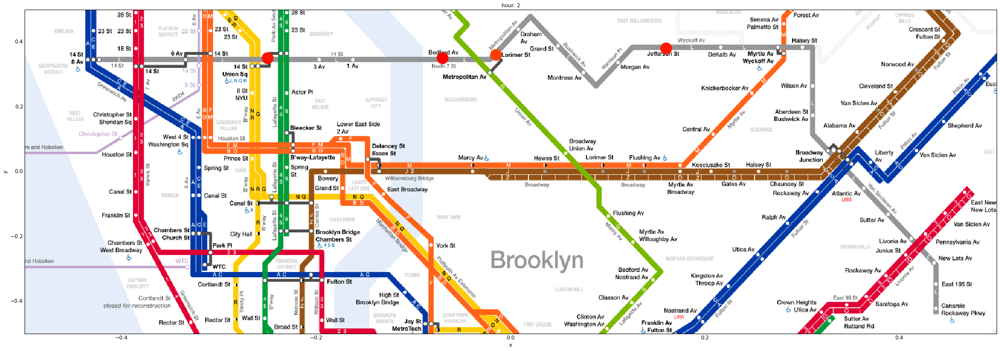
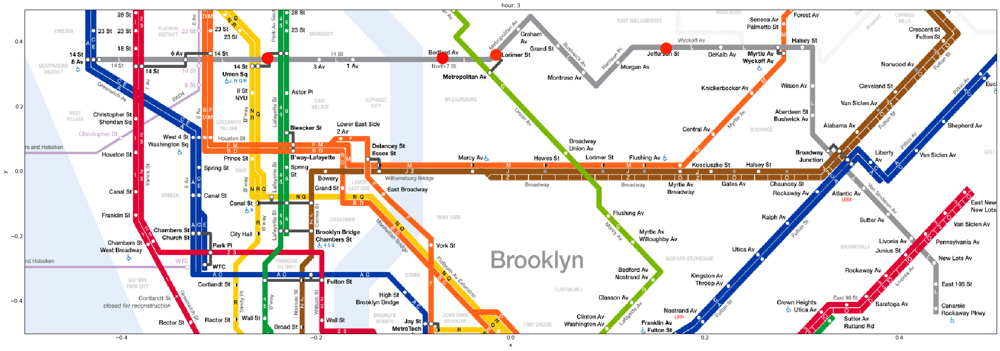
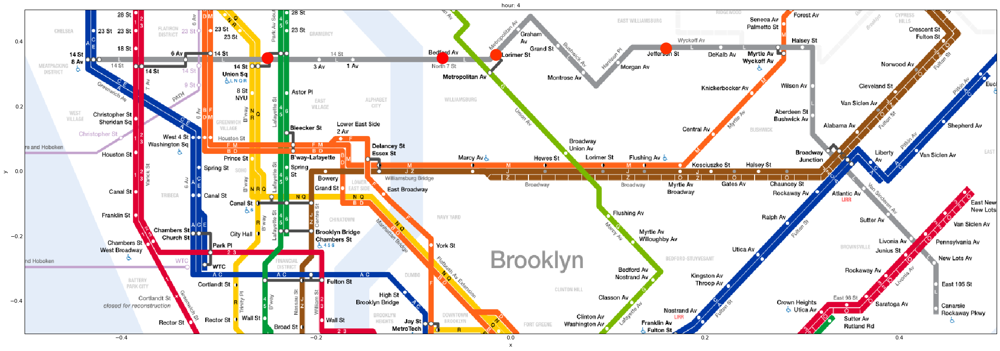
...
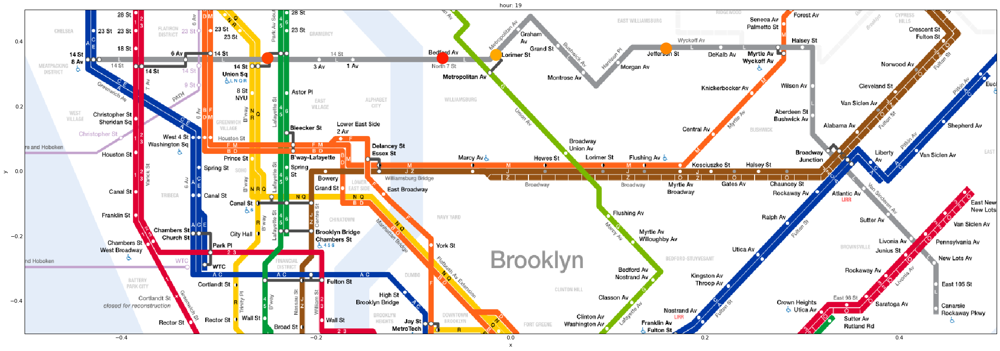
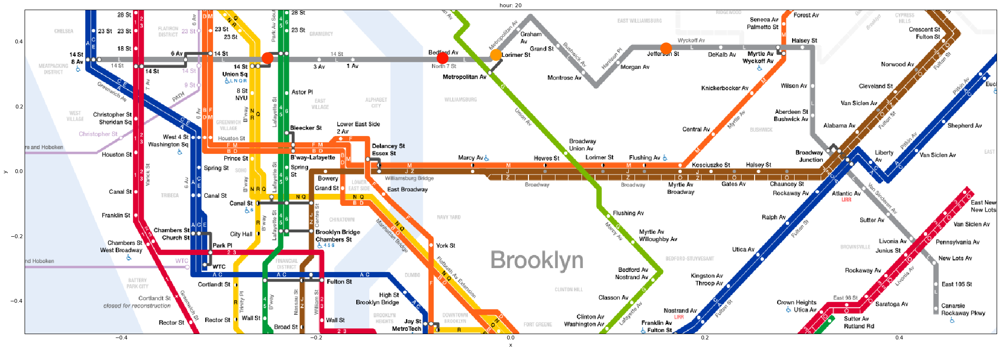
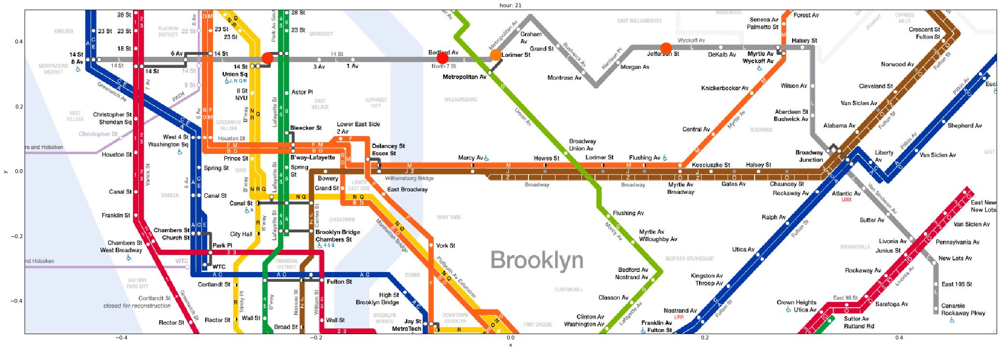
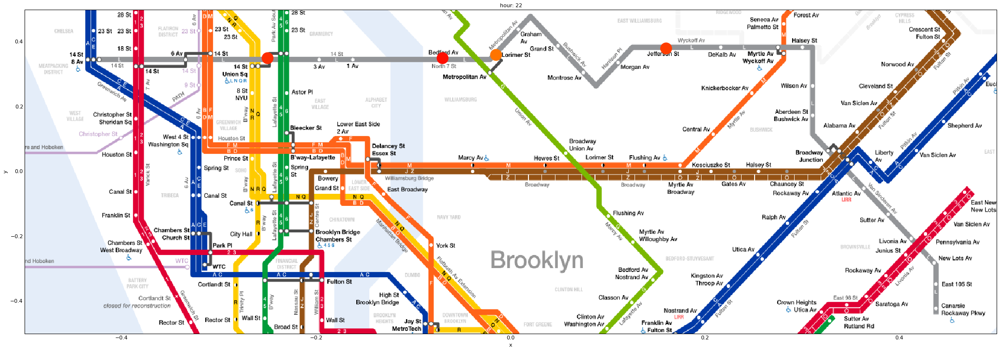
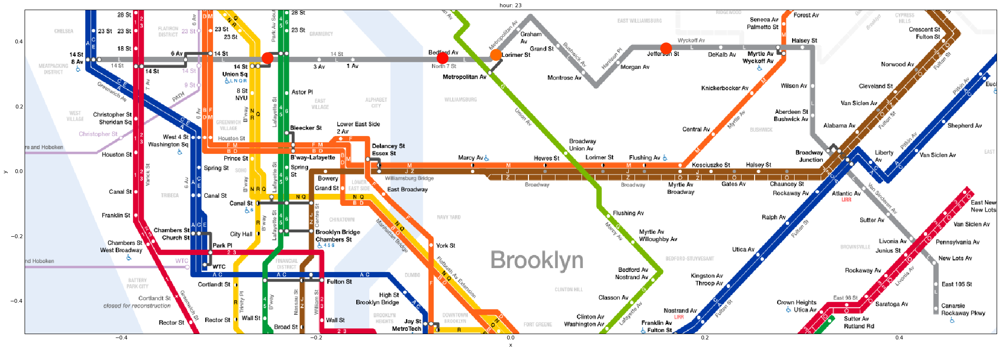

In [12]:
%%opts Layout [aspect_weight=1.0] Overlay [fig_size=1000 aspect=3] Points [color_index=2 size_index=3 scaling_factor=100] Points style(cmap='autumn')
image = hv.RGB.load_image('NYC_subway_L.png', array=True)
rgb = hv.RGB(image)
points_array = np.array([
        [-0.25, 0.35, 0, 1],
        [-0.07, 0.35, 0, 1],
        [-0.015, 0.36, 0, 1],
        [0.16, 0.38, 0, 1],
    ])
holomap = hv.HoloMap(kdims=['hour'])
for hour in range(24):
    pa = points_array.copy()
    pa[:, 2] = dataset[hour]
    points_el = hv.Points(pa, vdims=['z', 'alpha'])
    holomap[hour] = rgb * points_el
holomap

Визуализируем эти же данные с помощью графика зависимости пассажиропотоков от времени суток:

In [13]:
dataset.T.plot()
plt.show()

# Что возможно дальше:

* Применить использованные методы к данным из российских метрополитенов
* Построить более полную визуализацию (используя данные о всех станциях)
* Показать зависимость не только от времени суток, но и от даты, сезона, дня недели...
* Так как данные представляют собой зависимость многих величин от времени, можно применить методы анализа временных рядов (ARMA, VAR, кросс-корреляция) для прогнозирования нагрузки
* Применить методы машинного обучения, используя разные переменные в качестве признаков и результатов
* Применить вероятностные методы

# Задание выполнили:

## Наталья Глазкина
## Олег Пруц
## Иван Крупнов
## Андрей Федотов

# Спасибо за внимание!